In [1]:
# Resolve path when used in a usecase project
import sys
from pathlib import Path

sys.path.insert(0, str(Path("../../../").resolve()))

# Plotting for Batch Analytics Use Case

In addition to basic charts, there are several plots specifically used in the batch analytics use case for exploratory data analysis (EDA).

In a batch analytics usecase, there are typically 2 data sources needed:

* `sensor_data`: containing the value of a sensor for each specified time granularity; each timestep is assigned to a batch and (**optionally**) to a phase.


* `batch_meta`: containing meta information about each batch such as start/end time of the batch and (**optionally**) start/end time of the batch phase.

Below we provide an example of these datasets.

## `datasets`

### `get_sensor_data_batched_phased`

This function returns a dataset with timeseries of all available sensors. Each timestamp (`datetime`) is assigned to batch (`batch_id`).

In [2]:
from reporting.datasets import get_sensor_data_batched_phased

sensor_data = get_sensor_data_batched_phased()
sensor_data.head()

,batch_id,datetime,filter_infeed,filter_trough_lvl,reactor_P,reactor_acid_total,reactor_agitator_speed,reactor_temp,reactor_phase,filter_phase
0,0,2017-03-27 00:02:00,-0.150427,-0.438200,0.000000,0.0,-2.210738,0.000000,reactor,NaN
1,0,2017-03-27 00:03:00,-1.512210,-0.026476,0.544865,10.0,-3.483328,1.816217,reactor,NaN
2,0,2017-03-27 00:04:00,1.682967,0.105978,0.970921,20.0,-3.996372,3.236404,reactor,NaN
3,0,2017-03-27 00:05:00,-0.005933,-0.663973,1.185266,30.0,-3.638000,3.950888,reactor,NaN
4,0,2017-03-27 00:06:00,0.930157,-0.744507,1.141162,40.0,-2.486354,3.803872,reactor,NaN


### `get_batch_meta_with_features`

This function retrieves a dataset with batch metadata. Each batch (`index` column) is described by its phases' start and end times. In this case we have reactor and then filter phases with their times respectively:
* `reactor_start_time` and `reactor_end_time`
* `filter_start_time` and `filter_end_time`

The rest of columns are **optional** batch-level features.

In [3]:
from reporting.datasets import get_batch_meta_with_features

batch_meta = get_batch_meta_with_features()
batch_meta.head()

,reactor_start_time,reactor_end_time,filter_start_time,filter_end_time,reactor,filter,reactor_temp_mean_reactor,reactor_temp_std_reactor,reactor_temp_first_reactor,reactor_temp_last_reactor,...,filter_infeed_mean_filter,filter_infeed_std_filter,filter_infeed_first_filter,filter_infeed_last_filter,filter_infeed_sum_filter,filter_infeed_median_filter,filter_infeed_amin_filter,filter_infeed_amax_filter,filter_infeed_increase_filter,batch_type
batch_id,,,,,,,,,,,,,,,,,,,,,
0,2017-03-27 00:02:00,2017-03-27 00:40:00,2017-03-27 00:52:00,2017-03-27 01:05:00,reactor_1,filter_a,0.132368,2.873912,0.000000,-3.949084,...,1.0,0.0,1.0,1.0,13.0,1.0,1.0,1.0,0.0,NaN
1,2017-03-27 00:41:00,2017-03-27 01:58:00,2017-03-27 02:12:00,2017-03-27 02:24:00,reactor_1,filter_a,0.103647,2.143808,0.000000,-3.810889,...,3.0,0.0,3.0,3.0,36.0,3.0,3.0,3.0,0.0,NaN
2,2017-03-27 01:59:00,2017-03-27 02:09:00,2017-03-27 02:44:00,2017-03-27 02:45:00,reactor_1,filter_a,1.032333,2.610962,0.000000,-3.565194,...,3.0,NaN,3.0,3.0,3.0,3.0,3.0,3.0,0.0,NaN
3,2017-03-27 02:10:00,2017-03-27 02:31:00,2017-03-27 02:51:00,2017-03-27 03:04:00,reactor_1,filter_a,-0.126185,1.081156,0.000000,1.206284,...,3.0,0.0,3.0,3.0,39.0,3.0,3.0,3.0,0.0,NaN
4,2017-03-27 02:32:00,2017-03-27 03:48:00,2017-03-27 04:06:00,2017-03-27 04:13:00,reactor_1,filter_a,0.241372,1.659159,2.685522,-2.843558,...,1.0,0.0,1.0,1.0,7.0,1.0,1.0,1.0,0.0,NaN


## Batch profiling with `plot_batches_profiles`

Helps to easily compare sensor behavior in and across batches

**What it is**

A plot of multiple sensors of **one batch** in separate graphs based on the scale of variation in sensor values

**What we can learn**

* Observing the **trends** in a particular sensor profile and **comparing across batches** can **reveal patterns**


* Observing the **trends** in all sensor profiles **within a batch** can reveal the **similarities** and **differences** in trajectories of profiles

### Default plotting

In this basic example we show how to plot basic batch profiles

Note, this function returns a mapping from `batch_id` to batch profile

By default there's only one requirement for the data – each batch should be labeled with its id, this labeling is provided as a `batch_id_column` argument.

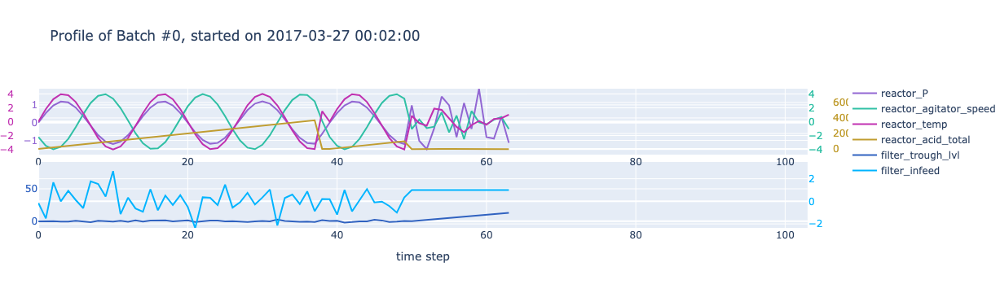

In [4]:
from reporting.reports import plot_batches_profiles
from reporting.datasets import get_sensor_data_batched_phased
from reporting.rendering.interactive import create_plot_demonstration_widget

sensor_data = get_sensor_data_batched_phased()
# in this tutorial we'll be using only first 3 batches
# to showcase the functionality
sensor_data = sensor_data[sensor_data['batch_id'].isin({0, 1, 2})]

figs = plot_batches_profiles(
    sensor_data=sensor_data,
    sensors_to_plot=[
        "reactor_P",
        "reactor_agitator_speed",
        "reactor_temp",
        "reactor_acid_total",
        "filter_trough_lvl",
        "filter_infeed",
    ],
    batch_id_column="batch_id",
    datetime_column="datetime",
)

figs[0]

<div class="alert alert-info">
<b>Note:</b> 
Use cell below to run interactive widget
</div>

In [5]:
# from reporting.rendering.interactive import create_plot_demonstration_widget
# create_plot_demonstration_widget(figs)

### Adding events to the plot

Users can show different events on profiles.

This might be helpful after the phase assignment happens and we have start/end time for each batch's phase. That helps to understand batch production steps better. Or if some unexpected stops happen, etc.

To draw those lines we use the following arguments:

* `batch_meta` stores meta data on a batch-level including times to mark
* `times_to_mark` argument tells which columns to use from `batch_meta` to get time marks

In this example we will use sample batch meta from `get_batch_meta_with_features()` to depict the following times: `reactor_start_time`, `reactor_end_time`, `filter_start_time`, `filter_end_time`.

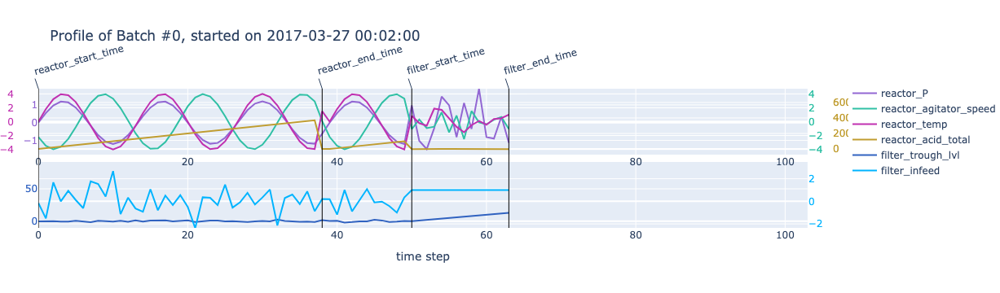

In [6]:
from reporting.reports import plot_batches_profiles
from reporting.datasets import (
    get_batch_meta_with_features,
    get_sensor_data_batched_phased,
)
from reporting.rendering.interactive import create_plot_demonstration_widget

batch_meta = get_batch_meta_with_features()
sensor_data = get_sensor_data_batched_phased()
# in this tutorial we'll be using only first 3 batches
# to showcase the functionality
sensor_data = sensor_data[sensor_data['batch_id'].isin({0, 1, 2})]

figs = plot_batches_profiles(
    sensor_data=sensor_data,
    sensors_to_plot=[
        "reactor_P",
        "reactor_agitator_speed",
        "reactor_temp",
        "reactor_acid_total",
        "filter_trough_lvl",
        "filter_infeed",
    ],
    batch_id_column="batch_id",
    datetime_column="datetime",
    batch_meta=batch_meta,
    times_to_mark=[
        'reactor_start_time',
        'reactor_end_time',
        'filter_start_time',
        'filter_end_time',
    ],
)

figs[0]

<div class="alert alert-info">
<b>Note:</b> 
Use cell below to run interactive widget
</div>

In [7]:
# from reporting.rendering.interactive import create_plot_demonstration_widget
# create_plot_demonstration_widget(figs)

### Plotting sensors on specific subplots

`plot_batches_profiles` function draws 4 sensors per each subplot and the distribution of those sensors is quite simple – first 4 sensors go to the first subplot, next 4 to the second and so on. Users can split those sensors into groups (i.e. by phases or using their analytics requirements) and plot different groups on different subplots.

To do so, users should provide a mapping from group to sensors list as `sensors_to_plot` argument. 

We can use any arbitrary grouping and use any number of sensors per each group. Sensors will be displayed within each provided group as if the were provided in a single group (4 sensors will be draw per each subplot: first on the left, second on the right etc.). Each group will be drawn on its own subplots. Note that **groups' order is preserved**.

#### Example 1. Group using phases

In this example we will draw profiles by phases, filter phase will go first then we will draw reactor phase. To do that we provide a mapping from phase to sensors of the phase as `sensors_to_plot` argument.

Note that **groups' order is preserved**, i.e. filter phase is show first and then goes reactor phase.

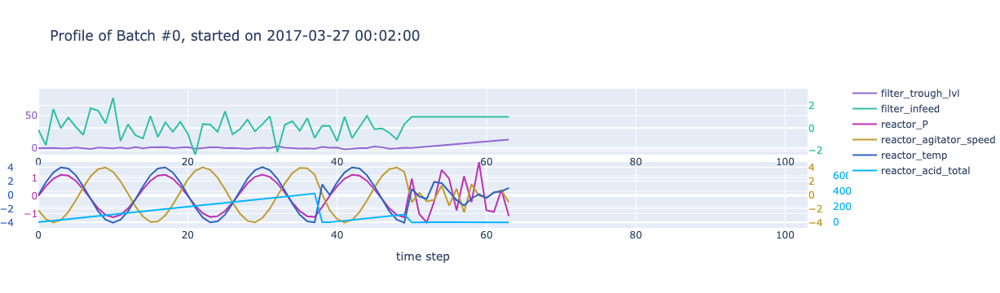

In [8]:
from reporting.reports import plot_batches_profiles
from reporting.datasets import (
    get_batch_meta_with_features,
    get_sensor_data_batched_phased,
)
from reporting.rendering.interactive import create_plot_demonstration_widget

batch_meta = get_batch_meta_with_features()
sensor_data = get_sensor_data_batched_phased()
# in this tutorial we'll be using only first 3 batches
# to showcase the functionality
sensor_data = sensor_data[sensor_data['batch_id'].isin({0, 1, 2})]

# sensors are provided as a mapping from phasees to sensors
sensors_to_plot = {
    "filter": ["filter_trough_lvl", "filter_infeed"],
    "reactor": [
        "reactor_P",
        "reactor_agitator_speed",
        "reactor_temp",
        "reactor_acid_total",
    ],
}

figs = plot_batches_profiles(
    sensor_data=sensor_data,
    sensors_to_plot=sensors_to_plot,
    batch_id_column="batch_id",
    datetime_column="datetime",
)

figs[0]

<div class="alert alert-info">
<b>Note:</b> 
Use cell below to run interactive widget
</div>

In [9]:
# from reporting.rendering.interactive import create_plot_demonstration_widget
# create_plot_demonstration_widget(figs)

#### Example 2. Group using sensors' similarity

For example to show sensors' similarity/dissimilarity.

Consider the following example. We suspect some correlation in `reactor_acid_total` and `filter_trough_lvl` and want to plot them together. We also know that `reactor_temp` is highly connected to `reactor_P` so we want those to be groupped together as well. We can do that by passing this mapping as `sensors_to_plot` argument:

```python
sensors_to_plot = {
    "first_subplot": ["filter_trough_lvl", "reactor_acid_total"],
    "second_subplot": ["reactor_temp", "reactor_P"],
}
```

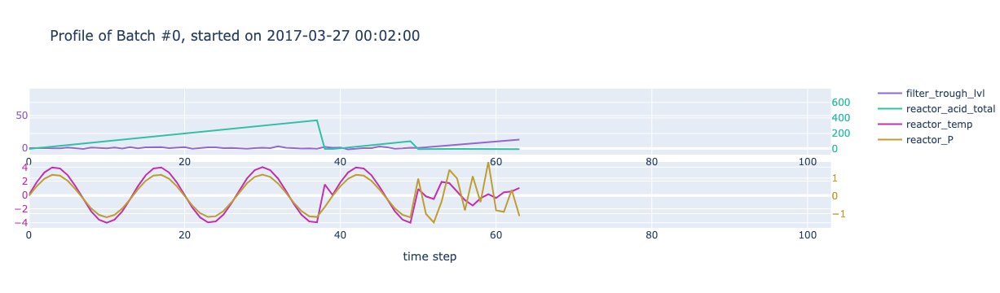

In [10]:
from reporting.reports import plot_batches_profiles
from reporting.datasets import (
    get_batch_meta_with_features,
    get_sensor_data_batched_phased,
)
from reporting.rendering.interactive import create_plot_demonstration_widget

batch_meta = get_batch_meta_with_features()
sensor_data = get_sensor_data_batched_phased()
# in this tutorial we'll be using only first 3 batches
# to showcase the functionality
sensor_data = sensor_data[sensor_data['batch_id'].isin({0, 1, 2})]

# sensors are provided as a mapping from phasees to sensors
sensors_to_plot = {
    "first_subplot": ["filter_trough_lvl", "reactor_acid_total"],
    "second_subplot": ["reactor_temp", "reactor_P"],
}

figs = plot_batches_profiles(
    sensor_data=sensor_data,
    sensors_to_plot=sensors_to_plot,
    batch_id_column="batch_id",
    datetime_column="datetime",
)

figs[0]

<div class="alert alert-info">
<b>Note:</b>
Use cell below to run interactive widget
</div>

In [11]:
# from reporting.rendering.interactive import create_plot_demonstration_widget
# create_plot_demonstration_widget(figs)

### Controlling batches' x-axis

#### Manually setting x-axis range

By default all batches are aligned on their x-axis using longest batch production time so that it's possible to do a cross batch comparison. But sometimes there exists an outlier batch that was produced for too long and we actualy don't want to view all batches at that length.

So if you want to provide some specific range of alignment across all batches, use `time_step_range` argument.

In this example we will set x-axis range to the first 100 time steps of the batch production. Doing this we aviod aligning all batches with the outlier.

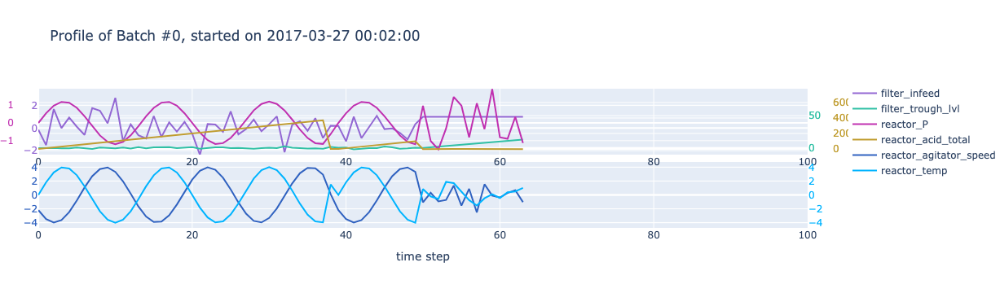

In [12]:
from reporting.reports import plot_batches_profiles
from reporting.datasets import get_sensor_data_batched_phased

sensor_data = get_sensor_data_batched_phased()
# in this tutorial we'll be using only first 3 batches
# to showcase the functionality
sensor_data = sensor_data[sensor_data['batch_id'].isin({0, 1, 2})]

figs = plot_batches_profiles(
    sensor_data=sensor_data,
    sensors_to_plot=[
        'filter_infeed',
        'filter_trough_lvl',
        'reactor_P',
        'reactor_acid_total',
        'reactor_agitator_speed',
        'reactor_temp',
    ],
    batch_id_column="batch_id",
    datetime_column="datetime",
    # Setting limit for showing first 100 steps of batch production
    time_step_range=(0, 100),
)

figs[0]

<div class="alert alert-info">
<b>Note:</b> 
Use cell below to run interactive widget
</div>

In [13]:
# from reporting.rendering.interactive import create_plot_demonstration_widget
# create_plot_demonstration_widget(figs)

#### Turning off cross batch alignment

By default all batches are aligned on their x-axis using longest batch production time so that it's possible to do a cross batch comparison.

In case you want to turn off that alignment pass `align_time_between_batches = False` argument. Then every batch x-axis will be reset to batch start/end time. It helps to view batches independently while breaking cross-batch comparison.

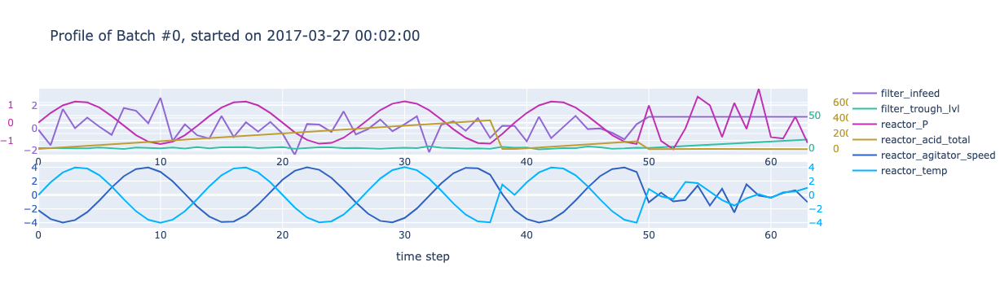

In [14]:
from reporting.reports import plot_batches_profiles
from reporting.datasets import get_sensor_data_batched_phased

sensor_data = get_sensor_data_batched_phased()
# in this tutorial we'll be using only first 3 batches
# to showcase the functionality
sensor_data = sensor_data[sensor_data['batch_id'].isin({0, 1, 2})]

figs = plot_batches_profiles(
    sensor_data=sensor_data,
    sensors_to_plot=[
        'filter_infeed',
        'filter_trough_lvl',
        'reactor_P',
        'reactor_acid_total',
        'reactor_agitator_speed',
        'reactor_temp',
    ],
    batch_id_column="batch_id",
    datetime_column="datetime",
    align_time_between_batches=False,  # Turning off cross batch alignment
)

figs[0]

<div class="alert alert-info">
<b>Note:</b> 
Use cell below to run interactive widget
</div>

In [15]:
# from reporting.rendering.interactive import create_plot_demonstration_widget
# create_plot_demonstration_widget(figs)

## Sensor Trend Plotting with `plot_sensor_trends`

This plot helps us to identify differences in trends between good and bad batches

**What it is**

Plotting sensor time series in different colors based on a group column. The group column can be batch performance, sensor (machine) identifier etc. 

**What we can learn**

* Plotting sensor time series in different colors based on batch performance can reveal predictive patterns. 


* Objective of this plot is to find new relationships between process variables and batch performance. 

### Example: Filter values overlay based on batch performance

In this example we show how to plot filter sensor time series with coloring based on the performance type of the batch they belong to. We will use the `plot_sensor_trends` function from the OAI `reporting` package with `trend_type` set to `overlay`. 

The filter values of our interests are `filter_trough_lvl` and `filter_infeed`. 

The batch data used for the plotting needs to have a column that identifies the performance type, for example `good` or `bad`, of each batch. We will use a package built-in processed batch data with performance type for illustration, omitting details on the creation of the column.

In [16]:
from reporting.datasets import (
    get_batch_meta_with_features,
    get_sensor_data_batched_phased,
)
from reporting.reports import plot_sensor_trends

batch_meta = get_batch_meta_with_features()
sensor_data = get_sensor_data_batched_phased()

Here we also use a **further processed** `sensor_data` with two additional columns `reactor_phase` and `filter_phase` which give the process phase tag to each timestamp of sensor values. This will help us take out the sensor values recorded **only during the phase that we are interested in**.

Since we are interested in the filter sensor values during **filter phase**, we get a subset of sensor data using the code below. Note that the `reactor_phase` column only has `NaN` now.

In [17]:
sensor_data = sensor_data.loc[sensor_data["filter_phase"] == "filter"]
sensor_data.head(4)

,batch_id,datetime,filter_infeed,filter_trough_lvl,reactor_P,reactor_acid_total,reactor_agitator_speed,reactor_temp,reactor_phase,filter_phase
50,0,2017-03-27 00:52:00,1.0,0.0,0.971042,-1.530968,-1.071562,0.850501,NaN,filter
51,0,2017-03-27 00:53:00,1.0,1.0,-1.019993,0.526092,0.319965,-0.205650,NaN,filter
52,0,2017-03-27 00:54:00,1.0,2.0,-1.490915,1.036413,-0.935394,-0.586117,NaN,filter
53,0,2017-03-27 00:55:00,1.0,3.0,-0.317085,-0.652391,-0.727137,1.874805,NaN,filter


In [18]:
figs = plot_sensor_trends(
    batch_meta=batch_meta,
    sensor_data=sensor_data,
    sensors_to_plot=["filter_trough_lvl", "filter_infeed"],
    datetime_col="datetime",
    batch_id_col="batch_id",
    trend_type="overlay",
    hue="batch_type",
    alpha=0.5,
    x_lim_quantile=0.9,
    height=600,
)

Let's take a look at the sensor overlay for `filter_trough_lvl`. We can notice the different pattern of `filter_trough_lvl` from good and bad batches and therefore can initially conclude that `filter_trough_lvl` is an important feature.

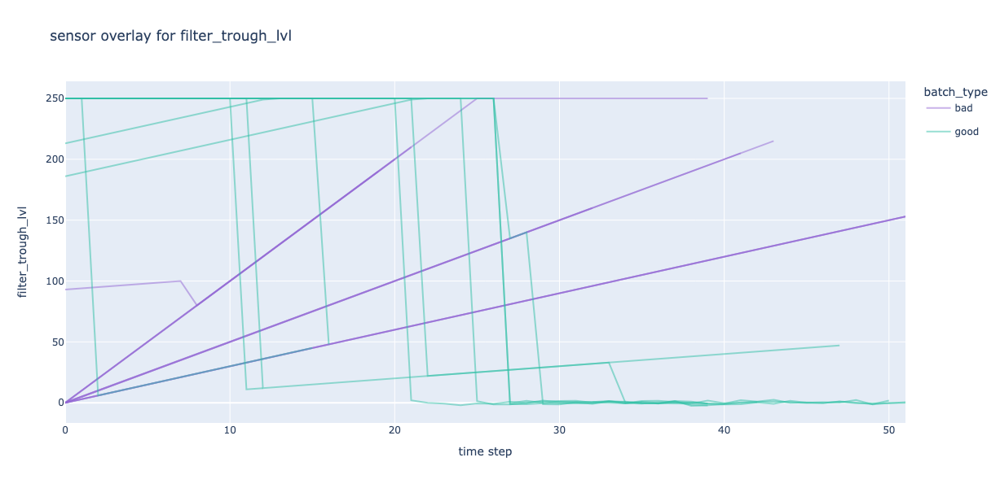

In [19]:
figs['sensor_trend_filter_trough_lvl']

<div class="alert alert-info">
<b>Note:</b> 
Use cell below to run interactive widget
</div>

In [20]:
# from reporting.rendering.interactive import create_plot_demonstration_widget
# create_plot_demonstration_widget(figs)

### Example: Reactor values range plot based on reactor machine

In this example we show how to plot confidence interval value range of reactor sensor time series with coloring based on the reactor machine that has recorded the values. We will use the `plot_sensor_trends` function from OAI reporting with `trend_type` set to `range`.

The reactor values of our interests are `reactor_agitator_speed` and `reactor_temp`. 

The batch data need to contain the **information of which reactor machine is used for each batch**. In our example `batch_meta`, this is shown in the `reactor` column. Also, in this example we are interested in the reactor values **only during reactor phase**, we will be filtering down the `sensor_data` with phase information using `reactor_phase` column.

Note that the range plot **takes some time** since we are doing bootstrapping under the hood to get the confidence interval of the sensor values.

In [21]:
from reporting.datasets import (
    get_batch_meta_with_features,
    get_sensor_data_batched_phased,
)
from reporting.reports import plot_sensor_trends

batch_meta = get_batch_meta_with_features()
sensor_data = get_sensor_data_batched_phased()

sensor_data = sensor_data.loc[sensor_data["reactor_phase"] == "reactor"]

figs = plot_sensor_trends(
    batch_meta=batch_meta,
    sensor_data=sensor_data,
    sensors_to_plot=["reactor_agitator_speed", "reactor_temp"],
    datetime_col="datetime",
    batch_id_col="batch_id",
    trend_type="range",
    hue="reactor",
    alpha=0.25,
    x_lim_quantile=0.9,
    error_method="ci",
    error_level=95,
    height=600,
)

Let's take a look at the value range of `reactor_agitator_speed` and `reactor_temp` obtained from machine `reactor_1`

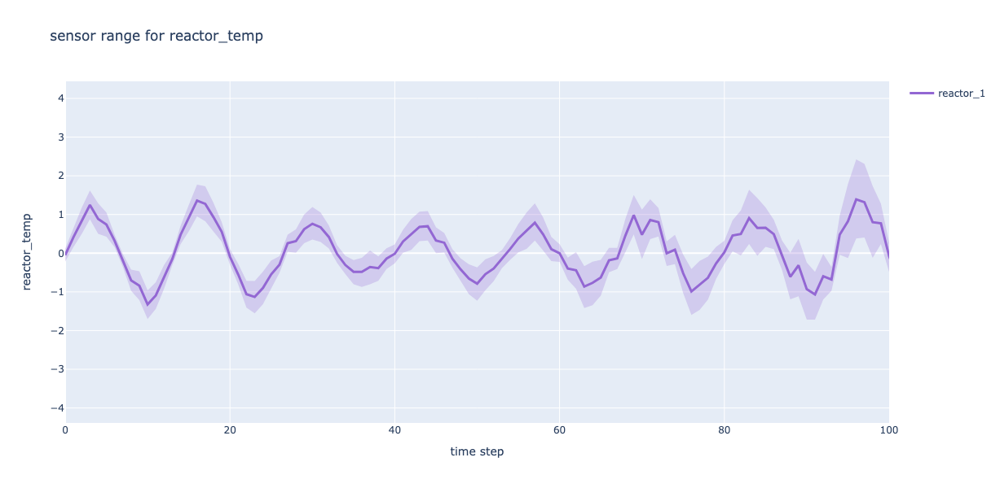

In [22]:
figs['sensor_trend_reactor_temp']

<div class="alert alert-info">
<b>Note:</b>
Use cell below to run interactive widget
</div>

In [23]:
# from reporting.rendering.interactive import create_plot_demonstration_widget
# create_plot_demonstration_widget(figs)